#สอบปลายภาค (ปฏิบัติ)

##ข้อ 3. จาก flower dataset ให้สร้าง classifier ด้วย ANN

In [ ]:
pip install tensorflow==2.15.0 tensorflow-hub keras==2.15.0

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import os
import PIL
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.python.keras.layers import Dense, Flatten
from tensorflow.keras.models import Sequential
import tensorflow_datasets as tfds
import math
import logging
logger = tf.get_logger()
logger.setLevel(logging.ERROR)

### Preparing The Data

In [ ]:
import pathlib
flowers_url = "https://storage.googleapis.com/download.tensorflow.org/example_images/flower_photos.tgz"
flowers_data = tf.keras.utils.get_file('flower_photos', origin=flowers_url, untar=True)
flowers_data = pathlib.Path(flowers_data)

228813984/228813984 [==============================] - 2s 0us/step


In [ ]:
print(flowers_data)

/root/.keras/datasets/flower_photos


/root/.keras/datasets/flower_photos/sunflowers/15122112402_cafa41934f.jpg


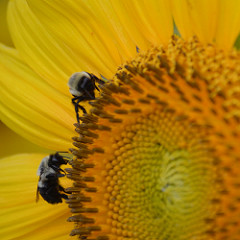

In [ ]:
all_sunflowers = list(flowers_data.glob('sunflowers/*'))
print(all_sunflowers[1])
PIL.Image.open(str(all_sunflowers[10]))

#### A. แสดงชุดข้อมูล กำหนด Training data = 70%

In [ ]:
height,width=180,180

training_batch_size=32

train_set = tf.keras.preprocessing.image_dataset_from_directory(
  flowers_data,
  validation_split=0.3,
  subset="training",
  seed=123,
  image_size=(height,width),
  batch_size=training_batch_size)

Found 3670 files belonging to 5 classes.
Using 2569 files for training.


In [ ]:
validation_set = tf.keras.preprocessing.image_dataset_from_directory(
  flowers_data,
  validation_split=0.3,
  subset="validation",
  seed=123,
  image_size=(height, width),
  batch_size=training_batch_size)

Found 3670 files belonging to 5 classes.
Using 1101 files for validation.


In [ ]:
image_cat = train_set.class_names
print(image_cat)

['daisy', 'dandelion', 'roses', 'sunflowers', 'tulips']


###Training The Model

####B.สร้างโมเดล ANN 4 Hidden Layers แสดง Model Summary รวมทั้ง Total Parameter

In [ ]:
model = tf.keras.Sequential([
    tf.keras.layers.Flatten(input_shape=(180, 180, 3)),
    tf.keras.layers.Dense(128, activation=tf.nn.relu),
    tf.keras.layers.Dense(512, activation=tf.nn.relu),
    tf.keras.layers.Dense(128, activation=tf.nn.relu),
    tf.keras.layers.Dense(256, activation=tf.nn.relu),
    tf.keras.layers.Dense(5, activation=tf.nn.softmax)
])

In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten (Flatten)           (None, 97200)             0         
                                                                 
 dense (Dense)               (None, 128)               12441728  
                                                                 
 dense_1 (Dense)             (None, 512)               66048     
                                                                 
 dense_2 (Dense)             (None, 128)               65664     
                                                                 
 dense_3 (Dense)             (None, 256)               33024     
                                                                 
 dense_4 (Dense)             (None, 5)                 1285      
                                                                 
Total params: 12607749 (48.09 MB)
Trainable params: 1260

In [ ]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(),
              metrics=['accuracy'])

In [ ]:
history = model.fit(
  train_set,
  validation_data=validation_set,
  epochs=10
)

Epoch 1/10
81/81 [==============================] - 9s 77ms/step - loss: 532.5203 - accuracy: 0.2476 - val_loss: 1.7456 - val_accuracy: 0.2289
Epoch 2/10
81/81 [==============================] - 6s 71ms/step - loss: 1.7309 - accuracy: 0.2425 - val_loss: 1.6012 - val_accuracy: 0.2334
Epoch 3/10
81/81 [==============================] - 5s 58ms/step - loss: 1.6000 - accuracy: 0.2511 - val_loss: 1.6002 - val_accuracy: 0.2334
Epoch 4/10
81/81 [==============================] - 6s 72ms/step - loss: 1.5996 - accuracy: 0.2503 - val_loss: 1.6006 - val_accuracy: 0.2325
Epoch 5/10
81/81 [==============================] - 5s 55ms/step - loss: 1.6078 - accuracy: 0.2503 - val_loss: 1.5958 - val_accuracy: 0.2389
Epoch 6/10
81/81 [==============================] - 5s 57ms/step - loss: 1.6032 - accuracy: 0.2487 - val_loss: 1.6024 - val_accuracy: 0.2343
Epoch 7/10
81/81 [==============================] - 6s 71ms/step - loss: 1.5954 - accuracy: 0.2503 - val_loss: 1.6019 - val_accuracy: 0.2343
Epoch 8/10


###Making Predictions

In [ ]:
import cv2
sample_image=cv2.imread(str(all_sunflowers[1]))
sample_image_resized= cv2.resize(sample_image, (height, width))
sample_image=np.expand_dims(sample_image_resized,axis=0)
print(sample_image.shape)

(1, 180, 180, 3)


In [ ]:
model_pred=model.predict(sample_image)
print(model_pred)

1/1 [==============================] - 0s 108ms/step
[[0.17837821 0.24869575 0.1703421  0.1838445  0.21873936]]


In [ ]:
predicted_class=image_cat[np.argmax(model_pred)]
print("The predicted category is", predicted_class)

The predicted category is dandelion


### Evaluate accuracy

In [ ]:
test_loss, test_accuracy = model.evaluate(validation_set, steps=math.ceil(2569/32))
print('Accuracy on test dataset:', test_accuracy)

81/81 [==============================] - 1s 13ms/step - loss: 1.6020 - accuracy: 0.2352
Accuracy on test dataset: 0.23524068295955658


In [ ]:
class_names = image_cat

In [ ]:
for test_images, test_labels in validation_set.take(1):
    test_images = test_images.numpy()
    test_labels = test_labels.numpy()
    predictions = model.predict(test_images)

1/1 [==============================] - 0s 26ms/step


In [ ]:
print(predictions.shape)

(32, 5)


In [ ]:
print(predictions[0])

[0.17837822 0.24869575 0.1703421  0.1838445  0.21873936]


In [ ]:
print(np.argmax(predictions[0]))

1


In [ ]:
print(test_labels[0])

3


In [ ]:
def plot_image(i, predictions_array, true_labels, images):
    predictions_array, true_label, img = predictions_array[i], true_labels[i], images[i]
    plt.grid(False)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(img.astype("uint8"))

    predicted_label = np.argmax(predictions_array)
    if predicted_label == true_label:
      color = 'blue'
    else:
      color = 'red'

    plt.xlabel("{} {:2.0f}% ({})".format(
        class_names[predicted_label],
        100 * np.max(predictions_array),
        class_names[true_label]
    ), color=color)

def plot_value_array(i, predictions_array, true_labels):
    predictions_array, true_label = predictions_array[i], true_labels[i]
    plt.grid(False)
    plt.xticks(range(5), class_names, rotation=45)
    plt.yticks([])
    thisplot = plt.bar(range(5), predictions_array, color="#777777")
    plt.ylim([0, 1])
    predicted_label = np.argmax(predictions_array)

    thisplot[predicted_label].set_color('red')
    thisplot[true_label].set_color('blue')

#### C.แสดงชุดข้อมูลที่ทำนายผิด

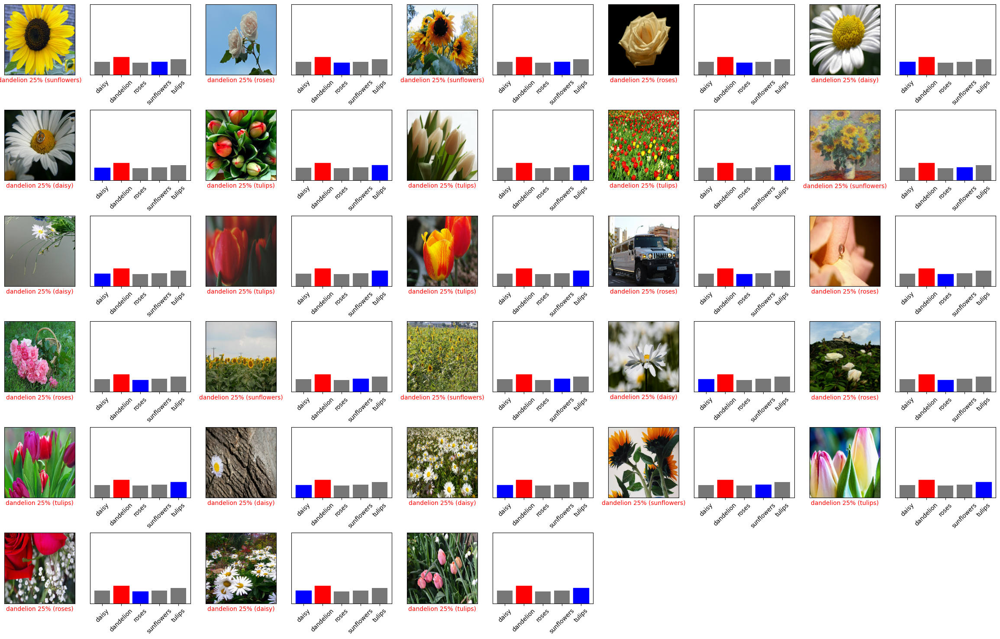

In [ ]:
incorrect_indices = [i for i in range(len(test_labels)) if np.argmax(predictions[i]) != test_labels[i]]

num_images = len(incorrect_indices)
num_cols = 5
num_rows = (num_images // num_cols) + int(num_images % num_cols > 0)

plt.figure(figsize=(3 * 2 * num_cols, 3 * num_rows))

for i in range(num_images):
    index = incorrect_indices[i]

    plt.subplot(num_rows, 2 * num_cols, 2 * i + 1)
    plot_image(index, predictions, test_labels, test_images)

    plt.subplot(num_rows, 2 * num_cols, 2 * i + 2)
    plot_value_array(index, predictions, test_labels)

plt.subplots_adjust(hspace=0.5, wspace=0.0)
plt.show()

####D.แสดงการทำนายข้อมูล ทุก Categpries

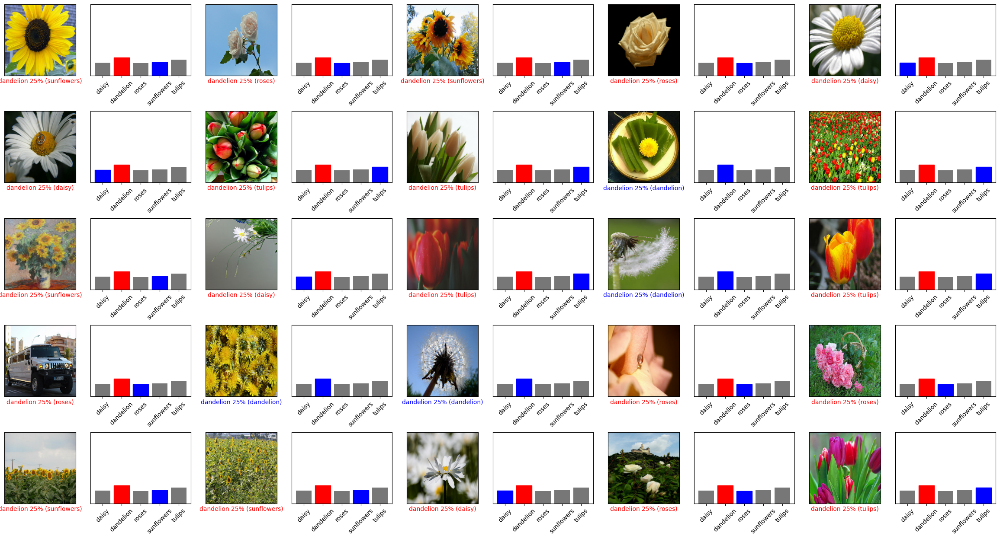

In [ ]:
num_rows = 5
num_cols = 5
num_images = num_rows * num_cols

plt.figure(figsize=(3*2*num_cols, 3*num_rows))

for i in range(num_images):
    plt.subplot(num_rows, 2 * num_cols, 2 * i + 1)
    plot_image(i, predictions, test_labels, test_images)

    plt.subplot(num_rows, 2 * num_cols, 2 * i + 2)
    plot_value_array(i, predictions, test_labels)

plt.subplots_adjust(hspace=0.5, wspace=0.0)

plt.show()

##ข้อ 4. จาก flower dataset ให้สร้าง classifier ด้วย CNN

In [ ]:
import pathlib
flowers_url = "https://storage.googleapis.com/download.tensorflow.org/example_images/flower_photos.tgz"
flowers_data = tf.keras.utils.get_file('flower_photos', origin=flowers_url, untar=True)
flowers_data = pathlib.Path(flowers_data)

In [ ]:
print(flowers_data)

/root/.keras/datasets/flower_photos


/root/.keras/datasets/flower_photos/sunflowers/15122112402_cafa41934f.jpg


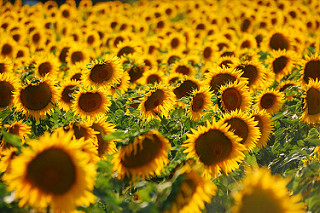

In [ ]:
all_sunflowers = list(flowers_data.glob('sunflowers/*'))
print(all_sunflowers[1])
PIL.Image.open(str(all_sunflowers[8]))

In [ ]:
height,width=180,180

training_batch_size=32

train_set = tf.keras.preprocessing.image_dataset_from_directory(
  flowers_data,
  validation_split=0.3,
  subset="training",
  seed=123,
  image_size=(height,width),
  batch_size=training_batch_size)

Found 3670 files belonging to 5 classes.
Using 2569 files for training.


In [ ]:
validation_set = tf.keras.preprocessing.image_dataset_from_directory(
  flowers_data,
  validation_split=0.3,
  subset="validation",
  seed=123,
  image_size=(height, width),
  batch_size=training_batch_size)

Found 3670 files belonging to 5 classes.
Using 1101 files for validation.


In [ ]:
image_cat = train_set.class_names
print(image_cat)

['daisy', 'dandelion', 'roses', 'sunflowers', 'tulips']


###Training The Model

####A.สร้าง Concolutional Layers 4 จำนวน และ Filter ในแต่ละ Layer 32

####B. Fully Connected Layers 4 และ จำนวนในแต่ละ Layer 128 Neurals และแสดง Model Summary และ Total Parameters

In [ ]:
model = tf.keras.Sequential([
    tf.keras.layers.Conv2D(32, (3,3), padding='same', activation=tf.nn.relu,
                           input_shape=(180, 180, 3)),
    tf.keras.layers.MaxPooling2D((2, 2), strides=2),
    tf.keras.layers.Conv2D(32, (3,3), padding='same', activation=tf.nn.relu),
    tf.keras.layers.MaxPooling2D((2, 2), strides=2),
    tf.keras.layers.Conv2D(32, (3,3), padding='same', activation=tf.nn.relu),
    tf.keras.layers.MaxPooling2D((2, 2), strides=2),
    tf.keras.layers.Conv2D(32, (3,3), padding='same', activation=tf.nn.relu),
    tf.keras.layers.MaxPooling2D((2, 2), strides=2),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(128, activation=tf.nn.relu),
    tf.keras.layers.Dense(128, activation=tf.nn.relu),
    tf.keras.layers.Dense(128, activation=tf.nn.relu),
    tf.keras.layers.Dense(128, activation=tf.nn.relu),
    tf.keras.layers.Dense(5, activation=tf.nn.softmax)
])

In [ ]:
model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_8 (Conv2D)           (None, 180, 180, 32)      896       
                                                                 
 max_pooling2d_8 (MaxPoolin  (None, 90, 90, 32)        0         
 g2D)                                                            
                                                                 
 conv2d_9 (Conv2D)           (None, 90, 90, 32)        9248      
                                                                 
 max_pooling2d_9 (MaxPoolin  (None, 45, 45, 32)        0         
 g2D)                                                            
                                                                 
 conv2d_10 (Conv2D)          (None, 45, 45, 32)        9248      
                                                                 
 max_pooling2d_10 (MaxPooli  (None, 22, 22, 32)       

In [ ]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(),
              metrics=['accuracy'])

In [ ]:
history = model.fit(
  train_set,
  validation_data=validation_set,
  epochs=10
)

Epoch 1/10
81/81 [==============================] - 13s 93ms/step - loss: 2.2815 - accuracy: 0.3266 - val_loss: 1.2322 - val_accuracy: 0.5005
Epoch 2/10
81/81 [==============================] - 5s 62ms/step - loss: 1.1602 - accuracy: 0.5236 - val_loss: 1.0872 - val_accuracy: 0.5595
Epoch 3/10
81/81 [==============================] - 7s 81ms/step - loss: 1.0371 - accuracy: 0.5792 - val_loss: 0.9923 - val_accuracy: 0.6094
Epoch 4/10
81/81 [==============================] - 6s 66ms/step - loss: 0.9146 - accuracy: 0.6454 - val_loss: 1.1272 - val_accuracy: 0.5640
Epoch 5/10
81/81 [==============================] - 7s 82ms/step - loss: 0.8011 - accuracy: 0.6886 - val_loss: 0.9370 - val_accuracy: 0.6267
Epoch 6/10
81/81 [==============================] - 5s 64ms/step - loss: 0.6561 - accuracy: 0.7454 - val_loss: 0.9763 - val_accuracy: 0.6294
Epoch 7/10
81/81 [==============================] - 7s 78ms/step - loss: 0.5590 - accuracy: 0.7859 - val_loss: 1.1121 - val_accuracy: 0.6376
Epoch 8/10
8

###Making Predictions

In [ ]:
import cv2
sample_image=cv2.imread(str(all_sunflowers[1]))
sample_image_resized= cv2.resize(sample_image, (height, width))
sample_image=np.expand_dims(sample_image_resized,axis=0)
print(sample_image.shape)

(1, 180, 180, 3)


In [ ]:
model_pred=model.predict(sample_image)
print(model_pred)

1/1 [==============================] - 0s 322ms/step
[[0.9329747  0.00268186 0.03331585 0.01545087 0.01557673]]


In [ ]:
predicted_class=image_cat[np.argmax(model_pred)]
print("The predicted category is", predicted_class)

The predicted category is daisy


### Evaluate accuracy

In [ ]:
test_loss, test_accuracy = model.evaluate(validation_set, steps=math.ceil(2569/32))
print('Accuracy on test dataset:', test_accuracy)

81/81 [==============================] - 1s 14ms/step - loss: 1.4278 - accuracy: 0.6530
Accuracy on test dataset: 0.6530426740646362


In [ ]:
class_names = image_cat

In [ ]:
for test_images, test_labels in validation_set.take(1):
    test_images = test_images.numpy()
    test_labels = test_labels.numpy()
    predictions = model.predict(test_images)

1/1 [==============================] - 0s 98ms/step


In [ ]:
print(predictions.shape)

(32, 5)


In [ ]:
print(predictions[0])

[5.8547808e-03 1.0929233e-01 4.6379530e-01 1.4321959e-05 4.2104328e-01]


In [ ]:
print(np.argmax(predictions[0]))

2


In [ ]:
print(test_labels[0])

2


In [ ]:
def plot_image(i, predictions_array, true_labels, images):
    predictions_array, true_label, img = predictions_array[i], true_labels[i], images[i]
    plt.grid(False)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(img.astype("uint8"))

    predicted_label = np.argmax(predictions_array)
    if predicted_label == true_label:
      color = 'blue'
    else:
      color = 'red'

    plt.xlabel("{} {:2.0f}% ({})".format(
        class_names[predicted_label],
        100 * np.max(predictions_array),
        class_names[true_label]
    ), color=color)

def plot_value_array(i, predictions_array, true_labels):
    predictions_array, true_label = predictions_array[i], true_labels[i]
    plt.grid(False)
    plt.xticks(range(5), class_names, rotation=45)
    plt.yticks([])
    thisplot = plt.bar(range(5), predictions_array, color="#777777")
    plt.ylim([0, 1])
    predicted_label = np.argmax(predictions_array)

    thisplot[predicted_label].set_color('red')
    thisplot[true_label].set_color('blue')

#### C.แสดงชุดข้อมูลที่ทำนายผิด

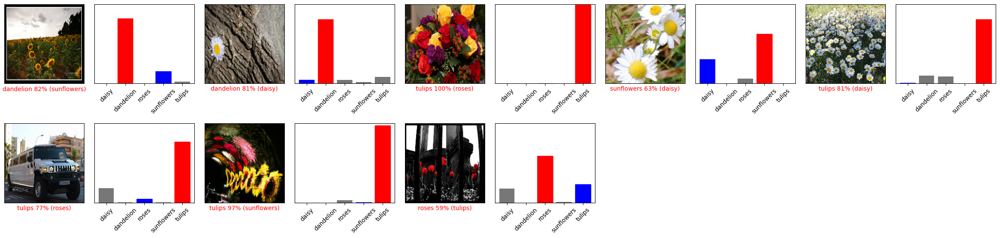

In [ ]:
incorrect_indices = [i for i in range(len(test_labels)) if np.argmax(predictions[i]) != test_labels[i]]

num_images = len(incorrect_indices)
num_cols = 5
num_rows = (num_images // num_cols) + int(num_images % num_cols > 0)

plt.figure(figsize=(3 * 2 * num_cols, 3 * num_rows))

for i in range(num_images):
    index = incorrect_indices[i]

    plt.subplot(num_rows, 2 * num_cols, 2 * i + 1)
    plot_image(index, predictions, test_labels, test_images)

    plt.subplot(num_rows, 2 * num_cols, 2 * i + 2)
    plot_value_array(index, predictions, test_labels)

plt.subplots_adjust(hspace=0.5, wspace=0.0)
plt.show()

####D.แสดงการทำนายข้อมูล ทุก Categpries

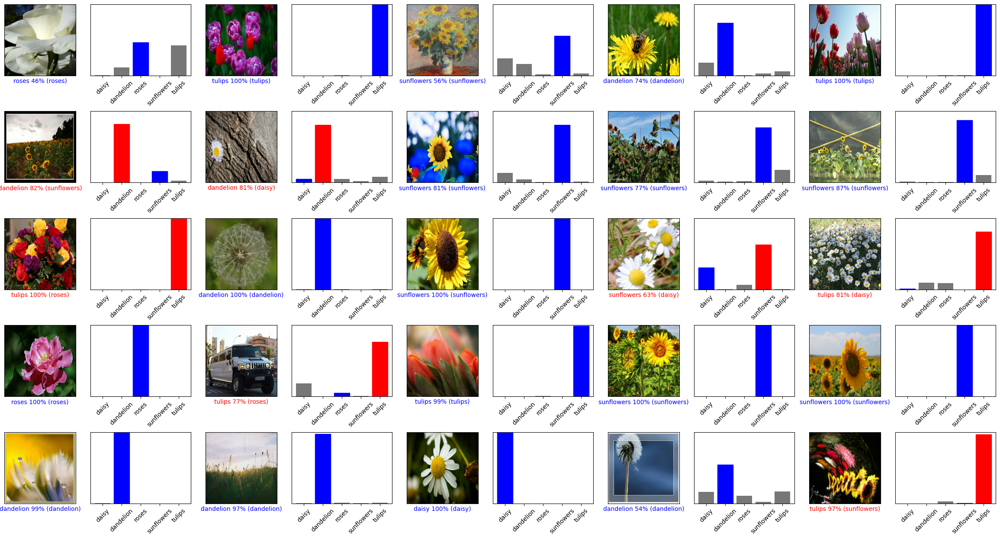

In [ ]:
num_rows = 5
num_cols = 5
num_images = num_rows * num_cols

plt.figure(figsize=(3*2*num_cols, 3*num_rows))

for i in range(num_images):
    plt.subplot(num_rows, 2 * num_cols, 2 * i + 1)
    plot_image(i, predictions, test_labels, test_images)

    plt.subplot(num_rows, 2 * num_cols, 2 * i + 2)
    plot_value_array(i, predictions, test_labels)

plt.subplots_adjust(hspace=0.5, wspace=0.0)

plt.show()

####E.ทดลองเปลี่ยนค่า

In [ ]:
model = tf.keras.Sequential([
    tf.keras.layers.Conv2D(32, (3,3), padding='valid', activation=tf.nn.leaky_relu,
                           input_shape=(180, 180, 3)),
    tf.keras.layers.MaxPooling2D((2, 2), strides=2),
    tf.keras.layers.Conv2D(32, (3,3), padding='valid', activation=tf.nn.leaky_relu),
    tf.keras.layers.MaxPooling2D((2, 2), strides=2),
    tf.keras.layers.Conv2D(32, (3,3), padding='valid', activation=tf.nn.leaky_relu),
    tf.keras.layers.MaxPooling2D((2, 2), strides=2),
    tf.keras.layers.Conv2D(32, (3,3), padding='valid', activation=tf.nn.leaky_relu),
    tf.keras.layers.MaxPooling2D((2, 2), strides=2),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(128, activation=tf.nn.leaky_relu),
    tf.keras.layers.Dense(128, activation=tf.nn.leaky_relu),
    tf.keras.layers.Dense(128, activation=tf.nn.leaky_relu),
    tf.keras.layers.Dense(128, activation=tf.nn.leaky_relu),
    tf.keras.layers.Dense(5, activation=tf.nn.softmax)
])


In [ ]:
model.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_20 (Conv2D)          (None, 178, 178, 32)      896       
                                                                 
 max_pooling2d_20 (MaxPooli  (None, 89, 89, 32)        0         
 ng2D)                                                           
                                                                 
 conv2d_21 (Conv2D)          (None, 87, 87, 32)        9248      
                                                                 
 max_pooling2d_21 (MaxPooli  (None, 43, 43, 32)        0         
 ng2D)                                                           
                                                                 
 conv2d_22 (Conv2D)          (None, 41, 41, 32)        9248      
                                                                 
 max_pooling2d_22 (MaxPooli  (None, 20, 20, 32)       

In [ ]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(),
              metrics=['accuracy'])

In [ ]:
history = model.fit(
  train_set,
  validation_data=validation_set,
  epochs=10
)

Epoch 1/10
81/81 [==============================] - 11s 86ms/step - loss: 2.7187 - accuracy: 0.3698 - val_loss: 1.2923 - val_accuracy: 0.4886
Epoch 2/10
81/81 [==============================] - 6s 64ms/step - loss: 1.1497 - accuracy: 0.5236 - val_loss: 1.1492 - val_accuracy: 0.5204
Epoch 3/10
81/81 [==============================] - 7s 80ms/step - loss: 1.0062 - accuracy: 0.6072 - val_loss: 1.0233 - val_accuracy: 0.6122
Epoch 4/10
81/81 [==============================] - 5s 63ms/step - loss: 0.9077 - accuracy: 0.6485 - val_loss: 1.0712 - val_accuracy: 0.5886
Epoch 5/10
81/81 [==============================] - 6s 72ms/step - loss: 0.7691 - accuracy: 0.7112 - val_loss: 1.1653 - val_accuracy: 0.5713
Epoch 6/10
81/81 [==============================] - 7s 82ms/step - loss: 0.6013 - accuracy: 0.7711 - val_loss: 1.0893 - val_accuracy: 0.6085
Epoch 7/10
81/81 [==============================] - 5s 64ms/step - loss: 0.5824 - accuracy: 0.7820 - val_loss: 1.2819 - val_accuracy: 0.5813
Epoch 8/10
8

###Making Predictions

In [ ]:
import cv2
sample_image=cv2.imread(str(all_sunflowers[1]))
sample_image_resized= cv2.resize(sample_image, (height, width))
sample_image=np.expand_dims(sample_image_resized,axis=0)
print(sample_image.shape)

(1, 180, 180, 3)


In [ ]:
model_pred=model.predict(sample_image)
print(model_pred)

1/1 [==============================] - 0s 314ms/step
[[1.1331245e-01 5.8142081e-07 1.2645611e-01 2.4642649e-01 5.1380438e-01]]


In [ ]:
predicted_class=image_cat[np.argmax(model_pred)]
print("The predicted category is", predicted_class)

The predicted category is tulips


### Evaluate accuracy

In [ ]:
test_loss, test_accuracy = model.evaluate(validation_set, steps=math.ceil(2569/32))
print('Accuracy on test dataset:', test_accuracy)

81/81 [==============================] - 2s 16ms/step - loss: 1.6538 - accuracy: 0.5976
Accuracy on test dataset: 0.5976384878158569


In [ ]:
class_names = image_cat

In [ ]:
for test_images, test_labels in validation_set.take(1):
    test_images = test_images.numpy()
    test_labels = test_labels.numpy()
    predictions = model.predict(test_images)

1/1 [==============================] - 0s 97ms/step


In [ ]:
print(predictions.shape)

(32, 5)


In [ ]:
print(predictions[0])

[6.1479521e-01 2.7225957e-05 1.7808242e-01 1.8283683e-03 2.0526676e-01]


In [ ]:
print(np.argmax(predictions[0]))

0


In [ ]:
print(test_labels[0])

4


In [ ]:
def plot_image(i, predictions_array, true_labels, images):
    predictions_array, true_label, img = predictions_array[i], true_labels[i], images[i]
    plt.grid(False)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(img.astype("uint8"))

    predicted_label = np.argmax(predictions_array)
    if predicted_label == true_label:
      color = 'blue'
    else:
      color = 'red'

    plt.xlabel("{} {:2.0f}% ({})".format(
        class_names[predicted_label],
        100 * np.max(predictions_array),
        class_names[true_label]
    ), color=color)

def plot_value_array(i, predictions_array, true_labels):
    predictions_array, true_label = predictions_array[i], true_labels[i]
    plt.grid(False)
    plt.xticks(range(5), class_names, rotation=45)
    plt.yticks([])
    thisplot = plt.bar(range(5), predictions_array, color="#777777")
    plt.ylim([0, 1])
    predicted_label = np.argmax(predictions_array)

    thisplot[predicted_label].set_color('red')
    thisplot[true_label].set_color('blue')

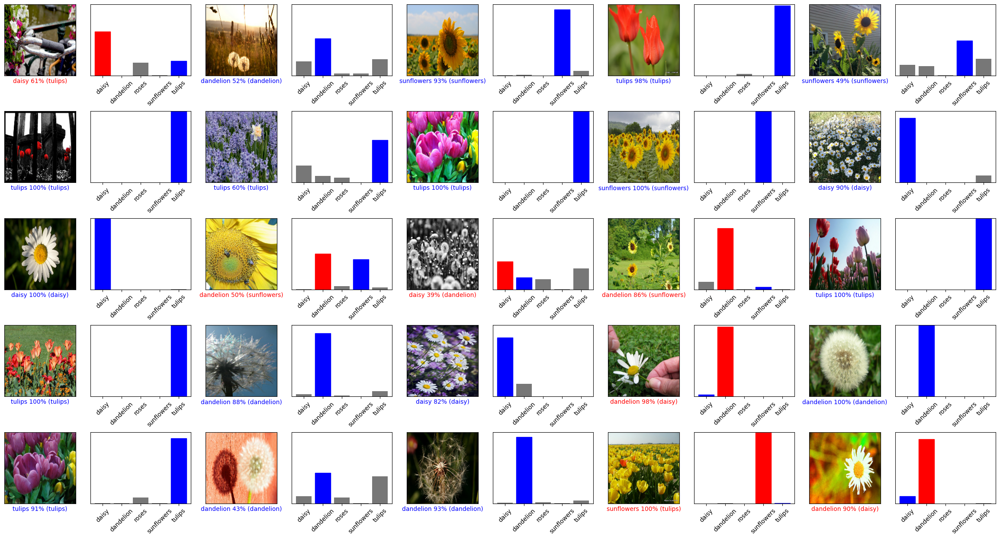

In [ ]:
num_rows = 5
num_cols = 5
num_images = num_rows * num_cols

plt.figure(figsize=(3*2*num_cols, 3*num_rows))

for i in range(num_images):
    plt.subplot(num_rows, 2 * num_cols, 2 * i + 1)
    plot_image(i, predictions, test_labels, test_images)

    plt.subplot(num_rows, 2 * num_cols, 2 * i + 2)
    plot_value_array(i, predictions, test_labels)

plt.subplots_adjust(hspace=0.5, wspace=0.0)

plt.show()